# 17.1. Case Study 4 Solution

## 17.2. Extracting Skill Requirements from Job Posting Data

We'll begin by loading all the HTML files in the `job_postings` directory.

**Listing 17. 1. Loading HTML files**

In [57]:
import glob
html_contents = []

for file_name in sorted(glob.glob('C:/Users/22600/3011/bookcamp_code/Case_Study4/job_postings/*.html')):
    with open(file_name, 'r',encoding="UTF-8") as f:
        html_contents.append(f.read())
        
print(f"We've loaded {len(html_contents)} HTML files.")
html_contents

We've loaded 1458 HTML files.


['<html><head><title>Data Scientist - Beavercreek, OH</title></head>\n<body><h2>Data Scientist - Beavercreek, OH</h2>\n<p><b>Data Scientist</b></p>\n<p><b>Position Overview:</b></p>\n<p>Centauri is looking for a detail oriented, motivated, and organized Data Scientist to work as part of a team to clean, analyze, and produce insightful reporting on government data. The ideal candidate is adept at using large data sets to find trends for intelligence reporting and will be proficient in process optimization and using models to test the effectiveness of different courses of action. They must have strong experience using a variety of data mining/data analysis methods, using a variety of data tools, building and implementing models, using/creating algorithms and producing easily understood visuals to represent findings. Candidate will work closely with Data Managers and stakeholders to tailor their analysis to answer key questions. The candidate must have a strong understanding of Geographic

We've loaded 1458 HTML files into `html_contents`. Each HTML file can be parsed using Beautiful Soup. 

**Listing 17. 2. Parsing HTML files**

In [58]:
from bs4 import BeautifulSoup as bs

soup_objects = []
for html in html_contents:
    soup = bs(html)
    assert soup.title is not None #相当于if判断，断言非空
    assert soup.body is not None
    soup_objects.append(soup)

Each parsed HTML file contains a title and a body.  Are there any duplicates across the titles or bodies of these files? We can find out by using Pandas.

**Listing 17. 3. Checking title and body texts for duplicates**

In [59]:
import pandas as pd
html_dict = {'Title': [], 'Body': []} #二维数组

for soup in soup_objects:
    title = soup.find('title').text #找到
    body = soup.find('body').text
    html_dict['Title'].append(title) #加入
    html_dict['Body'].append(body)
    
df_jobs = pd.DataFrame(html_dict) #转化为数组形式
summary = df_jobs.describe()  #特殊函数 R里查一下
print(summary)

                                Title  \
count                            1458   
unique                           1364   
top     Data Scientist - New York, NY   
freq                               13   

                                                     Body  
count                                                1458  
unique                                               1458  
top     Data Scientist - Beavercreek, OH\nData Scienti...  
freq                                                    1  


We’ve confirmed that no duplicates are present within the html. Now, lets explore the HTML content in more detail. The goal of our exploration will be to determine how job-skills are described in the HTML.

### 17.2.1. Exploring the HTML for Skill Descriptions

We’ll start our exploration by rendering the HTML at index of 0 of `html_contents`.

**Listing 17. 4. Rendering the HTML of the first job-posting**

In [60]:
from IPython.core.display import display, HTML
assert len(set(html_contents)) == len(html_contents)
display(HTML(html_contents[0]))

In [61]:
len(set(html_contents))

1458

We can subdivide `html_contents[0]` into 2 conceptually-different parts:

.. An initial job summary.
.. A list of bulleted skills required to get the job.

Is the next job posting structured in a similar manner? Lets find out, by rendering `html_contents[1]`.

**Listing 17. 5. Rendering the HTML of the second job-posting**

In [62]:
display(HTML(html_contents[1]))

The bullet-points in `html_contents[0]` and `html_contents[1]` serve a singular purpose. They offer us brief, sentence-length descriptions of unique skills required for each position.

Do these types of bulleted skill descriptions appear in other job posts? We’ll now find out. First, we’ll extract the bullets from each of our parsed html files. 

**Listing 17. 6. Extracting bullets from the HTML**

In [63]:
df_jobs['Bullets'] = [[bullet.text.strip() 
                      for bullet in soup.find_all('li')] #找到每个文件中的bullet text内容
                      for soup in soup_objects]
df_jobs['Bullets'][1]

['Interface with our internal engagement teams and clients to understand business questions, and perform analytical "deep dives" to develop relevant and interpretive insights in support of our client engagements',
 'Smartly leverage appropriate technologies to answer tough questions or understand root causes of unexpected outcomes and statistical anomalies',
 'Develop analysis tools which will influence both our products and clients; including python pipelines focused on the productization of data science and insights tools for marketing performance and optimization',
 'Feature generation and selection from a wide variety of raw data types including time series and graphs',
 "Work with the Amplero Product Team to provide ongoing feedback to the features and priorities most aligned with our clients' current and future needs to inform the product roadmap, test product hypotheses as well as to help plan the product lifecycle",
 "You're an expert with data analysis and visualization tools 

What percentage of job postings actually contain bulleted text? We need to find out! If that percentage is too low, then further bullet-analysis is not worth our time.

**Listing 17. 7. Measuring the percent of bulleted postings**

In [64]:
bulleted_post_count = 0
for bullet_list in df_jobs.Bullets:
    if bullet_list:
        bulleted_post_count += 1 
#bulleted_post_count

In [65]:
bulleted_post_count = 0
for bullet_list in df_jobs.Bullets:
    if bullet_list:
        bulleted_post_count += 1
            
percent_bulleted = 100 * bulleted_post_count / df_jobs.shape[0] #找到含bulletjob频率
print(f"{percent_bulleted:.2f}% of the postings contain bullets")

90.53% of the postings contain bullets


In [66]:
df_jobs.Bullets[3]

['Provides all personal care services in accordance with the plan of treatment assigned by the registered nurse',
 'Accurately documents care provided',
 'Applies safety principles and proper body mechanics to the performance of specific techniques of personal and supportive care, such as ambulation of patients, transferring patients, assisting with normal range of motions and positioning',
 'Participates in economical utilization of supplies and ensures that equipment and nursing units are maintained in a clean, safe manner',
 'Routinely follows and adheres to all policies and procedures',
 'Assists in performance improvement (PI) activities by serving on PI teams as warranted, assisting with PI measures and supporting and implementing changes necessary for improvement',
 'Maintains performance, patient and employee satisfaction and financial standards as outlined in the performance evaluation',
 'Performs compliance requirements as outlined in the Employee Handbook',
 'Must adhere to

90% of the job postings contain bullets. Do all (or most) of these bullets focus on skills? We better gage the contents of the bullet-points by printing the top-ranked words within their texts. Below, we'll we rank the words using summed TFDIF values. 

**Listing 17. 8. Examining the top-ranked words in the HTML bullet**

In [67]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

def rank_words(text_list):
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(text_list).toarray() 
    df = pd.DataFrame({'Words': vectorizer.get_feature_names(),
                       'Summed TFIDF': tfidf_matrix.sum(axis=0)}) #sum by column
    sorted_df = df.sort_values('Summed TFIDF', ascending=False)
    return sorted_df

all_bullets = []
for bullet_list in df_jobs.Bullets:
    all_bullets.extend(bullet_list)


    
sorted_df = rank_words(all_bullets)
print(sorted_df[:5].to_string(index=False)) #对bullet文本统计

vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(all_bullets).toarray() 
print(vectorizer.get_feature_names())
print(tfidf_matrix.sum(axis=0))
print(max(tfidf_matrix.sum(axis=0)))
print(tfidf_matrix)

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


     Words  Summed TFIDF
experience    878.030398
      data    842.978780
    skills    440.780236
      work    371.684232
   ability    370.969638


C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['00', '000', '00am', '00pm', '01', '0130', '0132', '0201', '03', '0301', '04', '0404', '05', '06', '0601', '07', '08', '0800', '0801', '0802', '09', '10', '100', '1000', '100gb', '100mm', '104', '10579466', '10b', '10g', '10k', '10m', '10pm', '10pt', '11', '1111', '115', '117', '11935', '11g', '12', '120', '12c', '13', '130', '1300', '1310', '134', '13485', '13560', '14', '1400', '1412', '14th', '15', '1500', '151', '1515', '1520', '1529', '1550', '15am', '15cm', '15pm', '15sf', '15th', '15the', '16', '168', '17', '170', '178', '178b', '18', '180', '180a', '1811', '1812', '185', '188', '18c', '18f', '19', '1910', '1940', '1946', '1950', '1955', '1959', '1959may', '1964', '1973', '1975', '1983', '1990', '1991', '1994', '1m', '1qimyh0mg3i1ntje6jdcdepjt2i4o8meb', '1st', '20', '200', '2000', '20000', '2002', '2008', '2009', '2011', '2012', '2013', '2015', '2016', '2017', '2018', '2018_05', '2019', '202', '2020', '2021', '2025', '208', '20allowances_0', '20bulletin', '20m', '20relocation',

[2.53562331 2.96042421 0.43892271 ... 0.57171542 0.49337269 0.3373733 ]
878.0303984946272
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


Terms such as _skills_ and _ability_ appear among the top 5 bulleted words. How do these bulleted words compare to the remaining words in each job posting? Lets find out. 

**Listing 17. 9. Examining the top-ranked words in the HTML bodies**

In [68]:
non_bullets = []
for soup in soup_objects:
    body = soup.body
    for tag in body.find_all('li'): 
        tag.decompose()
            
    non_bullets.append(body.text)
    
sorted_df = rank_words(non_bullets)
print(sorted_df[:5].to_string(index=False))
print(non_bullets)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



The words _skills_ and _ability_ are no longer present in the ranked output.  Thus, the non-bulleted text appears to be less skill-oriented than the bullet contents.

Strangely, the words _scientist_ and _science_ is missing from the list. Perhaps some posts pertain to data-driven jobs which aren't directly data science jobs? Lets actively explore this possibility. 

**Listing 17. 10. Checking titles for references to data science positions**

In [69]:
regex = r'Data Scien(ce|tist)' #可改进
df_non_ds_jobs = df_jobs[~df_jobs.Title.str.contains(regex, case=False)]

percent_non_ds = 100 * df_non_ds_jobs.shape[0] / df_jobs.shape[0]
print(f"{percent_non_ds:.2f}% of the job posting titles do not mention a "
       "data science position. Below is a sample of such titles:\n")
print(df_non_ds_jobs.shape[0])
print(df_jobs.shape[0])
for title in df_non_ds_jobs.Title[:10]:
    print(title)

64.33% of the job posting titles do not mention a data science position. Below is a sample of such titles:

938
1458
Patient Care Assistant / PCA - Med/Surg (Fayette, AL) - Fayette, AL
Data Manager / Analyst - Oakland, CA
Scientific Programmer - Berkeley, CA
JD Digits - AI Lab Research Intern - Mountain View, CA
Operations and Technology Summer 2020 Internship-West Coast - Universal City, CA
Data and Reporting Analyst - Olympia, WA 98501
Senior Manager Advanced Analytics - Walmart Media Group - San Bruno, CA
Data Specialist, Product Support Operations - Sunnyvale, CA
Deep Learning Engineer - Westlake, TX
Research Intern, 2020 - San Francisco, CA 94105


C:\Users\22600\AppData\Local\Temp\ipykernel_7244\3259922.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df_non_ds_jobs = df_jobs[~df_jobs.Title.str.contains(regex, case=False)]


Theirst posting on the list is for a _Patient Care Assistant_ or _PCA_. The erroneous posting contains skills that we both lack and also have no interest in obtaining.

**Listing 17. 11. Sampling bullets from a non-data science job**

In [70]:
bullets = df_non_ds_jobs.Bullets.iloc[0]
for i, bullet in enumerate(bullets[:5]):
     print(f"{i}: {bullet.strip()}")

0: Provides all personal care services in accordance with the plan of treatment assigned by the registered nurse
1: Accurately documents care provided
2: Applies safety principles and proper body mechanics to the performance of specific techniques of personal and supportive care, such as ambulation of patients, transferring patients, assisting with normal range of motions and positioning
3: Participates in economical utilization of supplies and ensures that equipment and nursing units are maintained in a clean, safe manner
4: Routinely follows and adheres to all policies and procedures


We need to leverage text similarity in order to filter out those jobs that do not align with our resume content. 
Lets proceed to filter the jobs by relevance.

## 17.3. Filtering Jobs by Relevance

Our goal is to evaluate job relevance using text similarity. We'll want to compare the text within each posting to our resume and/or book table-of-contents. In preparation, lets now store our resume within a `resume` string.

**Listing 17. 12. Loading the resume**

In [71]:
resume = open('resume.txt', 'r').read()
print(resume)

Experience

1. Developed probability simulations using NumPy.
2. Assessed online ad-clicks for statistical significance using Permutation testing.
3. Analyzed disease outbreaks using common clustering algorithms.

Additional Skills

1. Data visualization using Matplotlib.
2. Statistical analysis using SciPy.
3. Processing structured tables using Pandas.
4. Executing K-Means clustering and DBSCAN clustering using Scikit-Learn.
5. Extracting locations from text using GeonamesCache.
6. Location analysis and visualization using GeonamesCache and Basemap.
7. Dimensionality reduction with PCA and SVD, using Scikit-Learn.
8. NLP analysis and text topic detection using Scikit-Learn.


In this same manner, we can store the table of contents within a `table_of_contents` string.

**Listing 17. 13. Loading the table-of-content**

In [72]:
table_of_contents = open('table_of_contents.txt', 'r').read()

Together, `resume` and `table_of_contents` summarize our existing skill-set. Lets concatenate these skills into a single `existing_skills` string.

**Listing 17. 14. Combining skills into a single string**

In [73]:
existing_skills = resume + table_of_contents

We want to compute all similarities between `df_jobs.Body` and `existing_skills.` This computation first requires that we vectorize all texts. 

**Listing 17. 15. Vectorizing our skills and the job-posting data**

In [74]:
text_list = df_jobs.Body.values.tolist() + [existing_skills]
vectorizer = TfidfVectorizer(stop_words='english')  #可选择，多种选择 bert，vectorizer
tfidf_matrix = vectorizer.fit_transform(text_list).toarray()


Our vectorized texts are stored in a matrix format within `tfidf_matrix`. The final matrix row (`tfidf_matrix[-1]`) corresponds to our existing skill-set. Thus, we can easily compute the cosine similarities between the job postings and `existing_skills`, by running `tfdf_matrix[:-1] @ tfidf_matrix[-1]`. 

**Listing 17. 16. Computing skill-based cosine similarities**

In [75]:
cosine_similarities = tfidf_matrix[:-1] @ tfidf_matrix[-1] #cos similarities # ngram similarities
a=[1,2,3,4,5]
print(a[-1])
print(a[:-1])

5
[1, 2, 3, 4]


We can leverage `cosine_similarities` to rank to the jobs by relevance. Lets proceed to carry out the ranking. Afterwards, we'll confirm if the 20 least-relevant jobs have anything to do with data science.

**isting 17. 17. Printing the 20 least-relevant jobs**

In [76]:
df_jobs['Relevance'] = cosine_similarities
sorted_df_jobs = df_jobs.sort_values('Relevance', ascending=False)
for title in sorted_df_jobs[-20:].Title:
    print(title)

Data Analyst Internship (8 month minimum) - San Francisco, CA
Leadership and Advocacy Coordinator - Oakland, CA 94607
Finance Consultant - Audi Palo Alto - Palo Alto, CA
RN - Hattiesburg, MS
Configuration Management Specialist - Dahlgren, VA
Deal Desk Analyst - Mountain View, CA
Dev Ops Engineer AWS - Rockville, MD
Web Development Teaching Assistant - UC Berkeley (Berkeley) - Berkeley, CA
Scorekeeper - Oakland, CA 94612
Direct Care - All Experience Levels (CNA, HHA, PCA Welcome) - Norwell, MA 02061
Director of Marketing - Cambridge, MA
Certified Strength and Conditioning Specialist - United States
PCA - PCU Full Time - Festus, MO 63028
Performance Improvement Consultant - Los Angeles, CA
Patient Services Rep II - Oakland, CA
Lab Researcher I - Richmond, CA
Part-time instructor of Statistics for Data Science and Machine Learning - San Francisco, CA 94105
Plant Engineering Specialist - San Pablo, CA
Page Not Found - Indeed Mobile
Director of Econometric Modeling - External Careers


Almost all the printed jobs are completely irrelevant! Now, for comparison’s sake, lets print the 20 most-relevant job titles in `sorted_ds_jobs`.

**Listing 17. 18. Printing the 20 most-relevant jobs**

In [77]:
for title in sorted_df_jobs[:20].Title:
    print(title)

Chief Data Officer - Culver City, CA 90230
Data Scientist - Beavercreek, OH
Data Scientist Population Health - Los Angeles, CA 90059
Data Scientist - San Diego, CA
Data Scientist - Beavercreek, OH
Senior Data Scientist - New York, NY 10018
Data Architect - Raleigh, NC 27609
Data Scientist (PhD) - Spring, TX
Data Science Analyst - Chicago, IL 60612
Associate Data Scientist (BS / MS) - Spring, TX
Data Scientist - Streetsboro, OH 44241
Data Scientist - Los Angeles, CA
Sr Director of Data Science - Elkridge, MD
2019-57 Sr. Data Scientist - Reston, VA 20191
Data Scientist (PhD) - Intern - Spring, TX
Sr Data Scientist. - Alpharetta, GA 30004
Data Scientist GS 13/14 - Clarksburg, WV 26301
Data Science Intern (BS / MS) - Intern - Spring, TX
Senior Data Scientist - New York, NY 10038
Data Scientist - United States


Whenv`df_jobs.Relevance` is high, the associated job postings are relevant. As `df_jobs.Relevance` decreases, the associated jobs become less relevant. Thus, we can presume that there exists some `df_jobs.Relevance` cutoff, which separates the relevant jobs from the non-relevant jobs. Lets try to identify that cutoff. by visualizing the shape of the sorted relevance distribution.

**Listing 17. 19. Plotting job-ranking vs relevance**

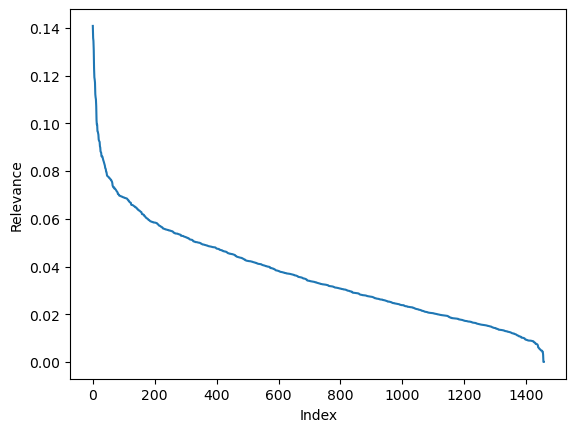

In [78]:
import matplotlib.pyplot as plt
plt.plot(range(df_jobs.shape[0]), sorted_df_jobs.Relevance.values)  #
plt.xlabel('Index')
plt.ylabel('Relevance')
plt.show()

Our relevance curve resembles a K-means Elbow plot. Initially, the relevance drops rapidly. Then, at an x-value of approximately 60, the curve begins to level off. Lets emphasize this transition by striking a vertical line through the x-position of 60 in our plot.

**Listing 17. 20. Adding a cutoff to the relevance plot**

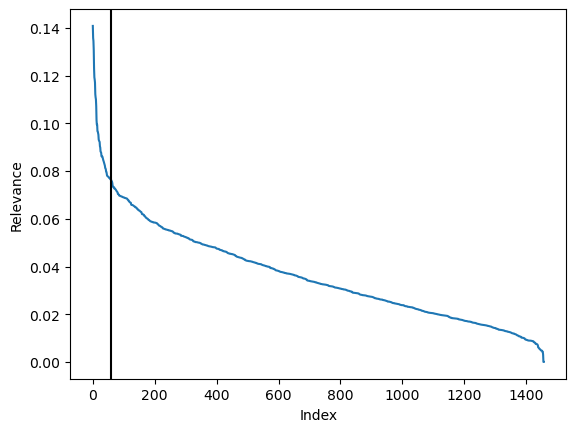

In [79]:
plt.plot(range(df_jobs.shape[0]), sorted_df_jobs.Relevance.values)
plt.xlabel('Index')
plt.ylabel('Relevance')
plt.axvline(60, c='k')
plt.show()

Our plot implies that the first 60 jobs are noticeably more relevant than all subsequent jobs. Based on our hypothesis, jobs 40 - 60 should be highly relevant.

**Listing 17. 21. Printing jobs below the relevance cutoff**

In [80]:
for title in sorted_df_jobs[40: 60].Title.values:
    print(title)

Data Scientist III - Pasadena, CA 91101
Global Data Engineer - Boston, MA
Data Analyst and Data Scientist - Summit, NJ
Data Scientist - Generalist - Glendale, CA
Data Scientist - Seattle, WA
IT Data Scientist - Contract - Riverton, UT
Data Scientist (Analytic Consultant 4) - San Francisco, CA
Data Scientist - Seattle, WA
Data Science & Tagging Analyst - Bethesda, MD 20814
Data Scientist - New York, NY
Senior Data Scientist - Los Angeles, CA
Principal Statistician - Los Angeles, CA
Senior Data Analyst - Los Angeles, CA
Data Scientist - Aliso Viejo, CA 92656
Data Engineer - Seattle, WA
Data Scientist - Digital Factory - Tampa, FL 33607
Data Scientist - Grapevine, TX 76051
Data Scientist - Bioinformatics - Denver, CO 80221
EPIDEMIOLOGIST - Los Angeles, CA
Data Scientist - Bellevue, WA


Almost all the printed jobs are are highly relevant. Implicity, the relevance should decrease when we print the next 20 job-titles, since they lie beyond the bounds of index 60. Lets verify if this is the case.

**Listing 17. 22. Printing jobs beyond the relevance cutoff**

In [81]:
for title in sorted_df_jobs[60: 80].Title.values:
    print(title)

Data Scientist - Aliso Viejo, CA
Data Scientist and Visualization Specialist - Santa Clara Valley, CA 95014
Data Scientist - Los Angeles, CA
Data Scientist Manager - NEW YORK LOCATION! - New York, NY 10036
Data Science Intern - San Francisco, CA 94105
Research Data Analyst - San Francisco, CA
Sr Data Scientist (Analytic Consultant 5) - San Francisco, CA
Data Scientist, Media Manipulation - Cambridge, MA
Manager, Data Science, Programming and Visualization - Boston, MA
Data Scientist in Broomfield, CO - Broomfield, CO
Senior Data Scientist - Executive Projects and New Solutions - Foster City, CA
Manager of Data Science - Burbank California - Burbank, CA
Data Scientist Manager - Hiring in Burbank! - Burbank, CA
Data Scientists needed in NY - Senior Consultants and Managers! - New York, NY 10036
Data Scientist - Menlo Park, CA
Data Engineer - Santa Clara, CA
Data Scientist - Remote
Data Scientist I-III - Phoenix, AZ 85021
SWE Data Scientist - Santa Clara Valley, CA 95014
Health Science Sp

A majority of the printed jobs refer to data science / analyst roles, outside the scope of health science or management. We can quickly quantify this observation using regular expressions. Below, we’ll define a `percent_relevant_tiles` function, which returns the percent of non-management data science and analysis jobs within a data frame slice.

**Listing 17. 23. Measuring title relevance in a subset of jobs**

In [82]:
import re
def percent_relevant_titles(df):
    regex_relevant = re.compile(r'Data (Scien|Analy)',
                                flags=re.IGNORECASE)
    regex_irrelevant = re.compile(r'\b(Manage)',
                                  flags=re.IGNORECASE)
    match_count = len([title for title in df.Title
                       if regex_relevant.search(title)
                       and not regex_irrelevant.search(title)])
    percent = 100 * match_count / df.shape[0]
    return percent

percent = percent_relevant_titles(sorted_df_jobs[60: 80])
print(f"Approximately {percent:.2f}% of job titles between indices "
       "60 - 80 are relevant")

Approximately 65.00% of job titles between indices 60 - 80 are relevant


Approximately 65% of the job-titles in `sorted_df_jobs[60: 80]` are relevant. Perhaps that percentage will drop if we sample the next 20 jobs, across an index range of 80 - 100. 

**Listing 17. 24. Measuring title relevance in the next subset of jobs**

In [83]:
percent = percent_relevant_titles(sorted_df_jobs[80: 100])
print(f"Approximately {percent:.2f}% of job titles between indices "
       "80 - 100 are relevant")

Approximately 80.00% of job titles between indices 80 - 100 are relevant


Nope! The data science title-percentage rose to 80%. At what point will the percentage drop below 50%? We can easily find out, using a plot.

**Listing 17. 25. Plotting percent relevance across all title samples**

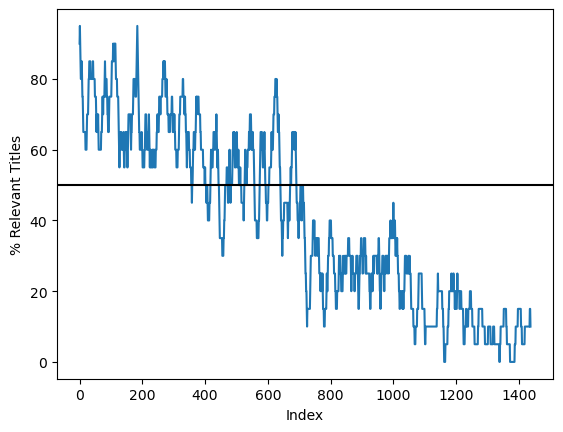

In [84]:
def relevant_title_plot(index_range=20): 
    percentages = []
    start_indices = range(df_jobs.shape[0] - index_range) 
    for i in start_indices:
        df_slice = sorted_df_jobs[i: i + index_range]
        percent = percent_relevant_titles(df_slice)
        percentages.append(percent)

    plt.plot(start_indices, percentages)
    plt.axhline(50, c='k')
    plt.xlabel('Index')
    plt.ylabel('% Relevant Titles')

relevant_title_plot()
plt.show()

The relevant Data Science titles drop below 50% at an index of around 700. Of course, its possible that the cutoff of 700 is merely an artifact of our chosen index range. Will the cutoff still be present if double our index range? Lets find out.

**Listing 17. 26. Plotting percent relevance across an increased index-range**

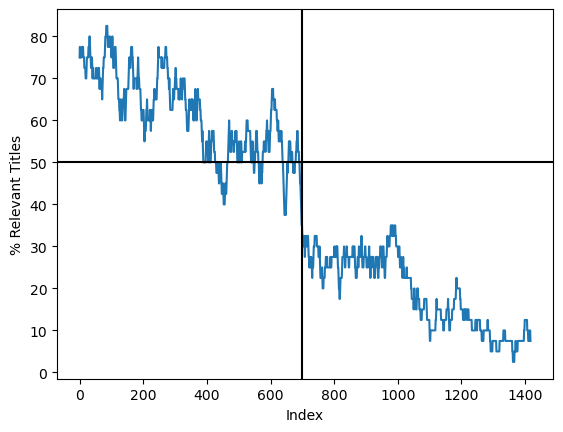

In [85]:
relevant_title_plot(index_range=40)
plt.axvline(700, c='k')
plt.show()

Our updated plot continues to drop below 50% at an index cutoff of 700.


At this point, we face a choice between 2 relevance cutoffs. Our first cutoff, at index 60, is highly precise. Meanwhile, our second cutoff of 700 captures many-more data science positions. So, which cutoff do we choose?  How about we try both cutoffs? That way compare the tradeoffs and benefits of each! 

We will now proceed to cluster the skills within the relevant job postings. Initially, we’ll set our relevance cutoff to an index of 60. 

## 17.4. Clustering Skills in Relevant Job Postings

Our aim is to cluster the skills within the 60 most-relevant job postings. The skills within each posting are diverse, and partially represented by bullet-points. Consequently, we’ll proceed to cluster the scraped bullets. We’ll start by storing `sorted_df_jobs[:60].Bullets` within a single list.

**Listing 17. 27. Obtaining bullets from the 60 most-relevant jobs**

In [86]:
total_bullets = []
for bullets in sorted_df_jobs[:60].Bullets:
    total_bullets.extend(bullets)

How many bullets are present in the list? Also, are any of the bullets duplicated? We can check using Pandas.

**Listing 17. 28. Summarizing basic bullet statistic**

In [87]:
df_bullets = pd.DataFrame({'Bullet': total_bullets})
print(df_bullets.describe())
print(total_bullets)

                                                   Bullet
count                                                1091
unique                                                900
top     Knowledge of advanced statistical techniques a...
freq                                                    9
['Work with stakeholders throughout the organization to identify opportunities for leveraging company data to drive business solutions', 'Mine and analyze data from company databases to drive optimization and improvement of product development, marketing techniques and business strategies', 'Assess the effectiveness and accuracy of new data sources and data gathering techniques', 'Develop custom data models and algorithms to apply to data sets', 'Use predictive modeling to increase and optimize customer experiences, revenue generation, ad targeting and other business outcomes', 'Develop company A/B testing framework and test model quality', 'Coordinate with different functional teams to implement mode

Only 900 of the bullets are unique. Below, we’ll filter empty strings and duplicates from our bullet list. Afterwards, we’ll vectorize the list using a TFIDF vectorizer.

**Listing 17. 29. Removing duplicates and vectorizing the bullets**

In [88]:
total_bullets = sorted(set(total_bullets))
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(total_bullets)
num_rows, num_columns = tfidf_matrix.shape
print(f"Our matrix has {num_rows} rows and {num_columns} columns")

Our matrix has 900 rows and 2070 columns


Our vectorized TFIDF matrix is too large for efficient clustering. Lets dimensionally reduce the matrix using the procedure described in Section Fifteen. 

**Listing 17. 30. Dimensionally reducing the TFIDF matrix**

In [89]:
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
np.random.seed(0)

def shrink_matrix(tfidf_matrix):
    svd_object = TruncatedSVD(n_components=100)
    shrunk_matrix = svd_object.fit_transform(tfidf_matrix)
    return normalize(shrunk_matrix)

shrunk_norm_matrix = shrink_matrix(tfidf_matrix)

print(shrunk_norm_matrix)

[[ 0.05529134 -0.16487529  0.24588486 ... -0.09439353 -0.04784281
  -0.07485167]
 [ 0.12610107  0.04167078 -0.03960668 ...  0.21409175 -0.06959536
   0.08493087]
 [ 0.20758449 -0.00284408 -0.10481854 ...  0.23311839 -0.13953659
   0.06466536]
 ...
 [ 0.17863968 -0.20766892  0.18208234 ...  0.04761019 -0.01548969
   0.04382031]
 [ 0.21268354  0.12882311  0.00694153 ...  0.06098695  0.03176382
  -0.10308518]
 [ 0.31077335  0.22592835 -0.11810971 ...  0.00502218 -0.02128974
  -0.00344569]]


In [90]:
a=[[1,2,3],[4,5,6],[7,8,9],[10,11,12]]
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
svd_object = TruncatedSVD(n_components=2)
shrunk_matrix = svd_object.fit(a).transform(a)
print(shrunk_matrix)
normalize(shrunk_matrix)

[[ 3.58705934  1.06442721]
 [ 8.75770068  0.55016253]
 [13.92834202  0.03589786]
 [19.09898335 -0.47836682]]


array([[ 0.95868193,  0.28448014],
       [ 0.99803262,  0.06269684],
       [ 0.99999668,  0.00257732],
       [ 0.99968648, -0.02503886]])

We are nearly ready to cluster our normalized matrix using K-means. However, we’ll first need to estimate K using an Elbow plot.

**Listing 17. 31. Plotting an elbow curve using Mini Batch K-Means**

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

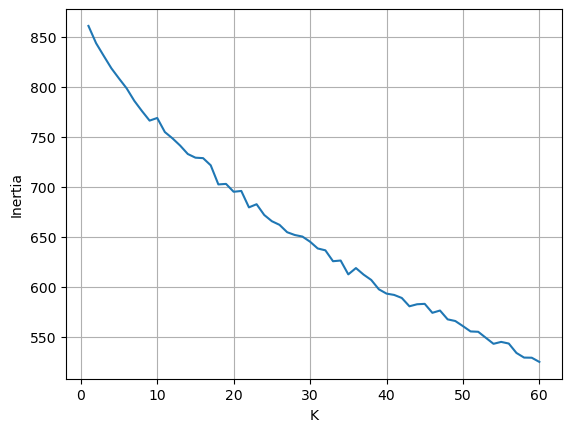

In [91]:
np.random.seed(0)
from sklearn.cluster import MiniBatchKMeans
def generate_elbow_plot(matrix):
    k_values = range(1, 61)
    inertia_values = [MiniBatchKMeans(k).fit(matrix).inertia_
                      for k in k_values]
    plt.plot(k_values, inertia_values)
    plt.xlabel('K')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.show()

generate_elbow_plot(shrunk_norm_matrix)

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

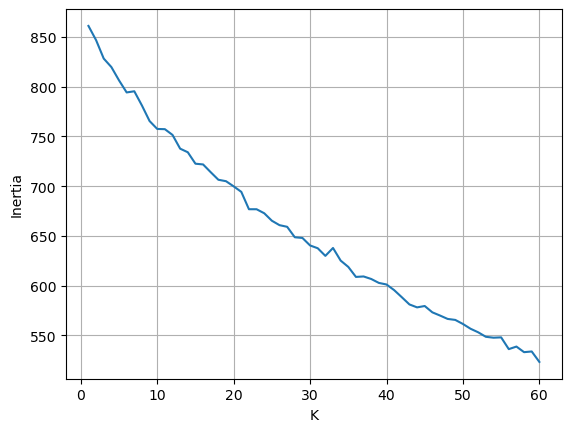

In [92]:
    matrix = shrunk_norm_matrix
    k_values = range(1, 61)
    inertia_values = [MiniBatchKMeans(k).fit(matrix).inertia_
                      for k in k_values]
    plt.plot(k_values, inertia_values)
    plt.xlabel('K')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.show()

The precise location of a bent elbow-shaped transition is difficult to spot. We don't know which K-value to choose. Lets cluster our data multiple times, using K-values of 10, 15, 20, and 25. Afterwards, we’ll compare and contrast the results.

### 17.4.1. Grouping the Job Skills into 15 Clusters

Below, we’ll execute K-means using a K of 15. 

**Listing 17. 32. Clustering bullets into 15 clusters**

In [93]:
np.random.seed(0)
from sklearn.cluster import KMeans

def compute_cluster_groups(shrunk_norm_matrix, k=15):
    cluster_model = KMeans(n_clusters=k)
    clusters = cluster_model.fit_predict(shrunk_norm_matrix)
    df = pd.DataFrame({'Index': range(clusters.size), 'Cluster': clusters,
                       'Bullet': total_bullets})
    return [df_cluster for  _, df_cluster in df.groupby('Cluster')]

cluster_groups = compute_cluster_groups(shrunk_norm_matrix)

Each of our text clusters is stored as a Pandas table within the `cluster_groups` list. We can visualize the clusters using word clouds. Below, we will define a `cluster_to_image` function, and then apply it to `cluster_groups[0]`.

**Listing 17. 33. Visualizing the first cluster**

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


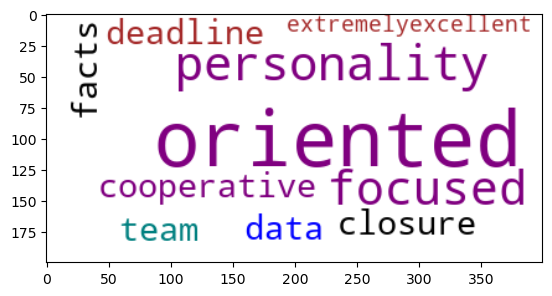

     Index  Cluster                                             Bullet
76      76        0       Aggressive — competitive and growth-oriented
201    201        0                          Data oriented personality
202    202        0                          Data-oriented personality
237    237        0                                    Detail-oriented
238    238        0    Detail-oriented — quality and precision-focused
444    444        0  Expertise in Object-Oriented design, coding an...
623    623        0  Outcome-oriented — results-focused with strong...
637    637        0  People-oriented — supportive and fairness-focused
732    732        0     Self-motivated, detail-oriented and passionate
737    737        0            Should be deadline and closure oriented
738    738        0  Should be extremelyExcellent facts and data or...
787    787        0  Team oriented; able to collaborate with a rang...
788    788        0      Team-oriented — cooperative and collaborative


In [94]:
from wordcloud import WordCloud
np.random.seed(0)

def cluster_to_image(df_cluster, max_words=10, tfidf_matrix=tfidf_matrix,
                     vectorizer=vectorizer): 
    
    indices = df_cluster.Index.values
    summed_tfidf = np.asarray(tfidf_matrix[indices].sum(axis=0))[0]
    data = {'Word': vectorizer.get_feature_names(),'Summed TFIDF': summed_tfidf}
    df_ranked_words = pd.DataFrame(data).sort_values('Summed TFIDF', ascending=False)
    words_to_score = {word: score
                     for word, score in df_ranked_words[:max_words].values
                     if score != 0}
    cloud_generator = WordCloud(background_color='white',
                                color_func=_color_func,
                                random_state=1)
    wordcloud_image = cloud_generator.fit_words(words_to_score)
    return wordcloud_image

def _color_func(*args, **kwargs):
    return np.random.choice(['black', 'blue', 'teal', 'purple', 'brown'])

wordcloud_image = cluster_to_image(cluster_groups[0])
plt.imshow(wordcloud_image, interpolation="bilinear")
plt.show()

print(cluster_groups[0])


The language in the word-cloud appears to be describing a focused, data-oriented personality. However, that language is a little vague. Perhaps we can learn more about the cluster by printing some sample bullets from `cluster_group[0]`.

**Listing 17. 34. Printing sample bullets from Cluster 0**

In [95]:
np.random.seed(1)
def print_cluster_sample(cluster_id):
    df_cluster = cluster_groups[cluster_id]
    for bullet in np.random.choice(df_cluster.Bullet.values, 5, 
                                   replace=False):
        print(bullet)

print_cluster_sample(0)

Data-oriented personality
Detail-oriented
Detail-oriented — quality and precision-focused
Should be extremelyExcellent facts and data oriented
Data oriented personality


Now, lets visualize all 15 clusters using word clouds. 

**Listing 17. 35. Visualizing all 15 clusters**

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_featur

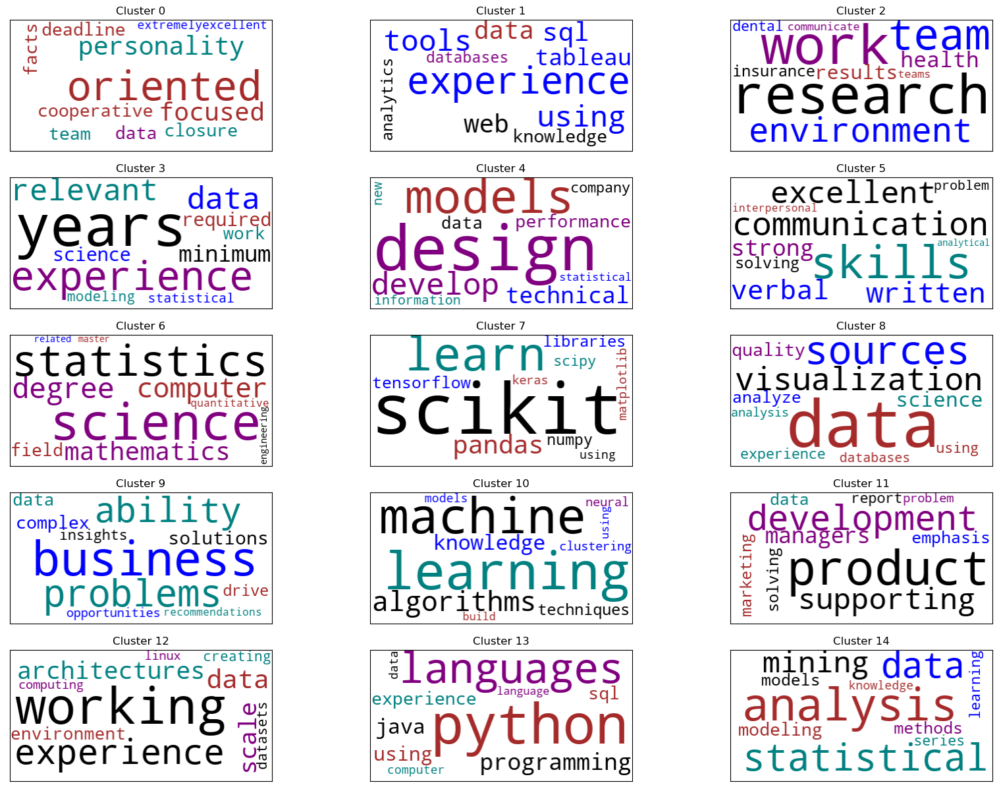

In [96]:
def plot_wordcloud_grid(cluster_groups, num_rows=5, num_columns=3,
                        **kwargs):
    figure, axes = plt.subplots(num_rows, num_columns, figsize=(20, 15))
    cluster_groups_copy = cluster_groups[:]
    for r in range(num_rows):
        for c in range(num_columns):
            if not cluster_groups_copy:
                break
                
            df_cluster = cluster_groups_copy.pop(0)
            wordcloud_image = cluster_to_image(df_cluster, **kwargs)
            ax = axes[r][c]
            ax.imshow(wordcloud_image,
            interpolation="bilinear")   
            ax.set_title(f"Cluster {df_cluster.Cluster.iloc[0]}")
            ax.set_xticks([])
            ax.set_yticks([])

plot_wordcloud_grid(cluster_groups)
plt.show()

Some of the clusters are highly technical. For instance, Cluster 7 fixates on external data science libraries such as Scikit-Learn, Pandas, NumPy, Matplotlib and SciPy. Lets print sample some bullets from Cluster 7, and confirm their focus on DS libraries.

**Listing 17. 36. Printing sample bullets from Cluster 7**

In [97]:
np.random.seed(1)
print_cluster_sample(7)

Experience using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow
Using one or more of the following software packages: scikit-learn, numpy, pandas, jupyter, matplotlib, scipy, nltk, spacy, keras, tensorflow
Experience with machine learning libraries and platforms, like Scikit-learn and Tensorflow
Proficiency in incorporating the use of external proprietary and open-source libraries such as, but not limited to, Pandas, Scikit- learn, Matplotlib, Seaborn, GDAL, GeoPandas, and ArcPy
Experience using ML libraries, such as scikit-learn, caret, mlr, mllib


Meanwhile, other clusters focus on non-technical skills. Perhaps we can separate the technical clusters and soft-skill clusters using text similarity (to our resume). Lets examine this possibility. We’ll start by computing the cosine similarity between each bullet in `total_bullets` and our resume.

**Listing 17. 37. Computing similarities between the bullets and our resume**

In [98]:
def compute_bullet_similarity(bullet_texts):
    bullet_vectorizer = TfidfVectorizer(stop_words='english')
    matrix = bullet_vectorizer.fit_transform(bullet_texts + [resume])
    matrix = matrix.toarray()
    return matrix[:-1] @ matrix[-1]

bullet_cosine_similarities = compute_bullet_similarity(total_bullets)
print([resume])

['Experience\n\n1. Developed probability simulations using NumPy.\n2. Assessed online ad-clicks for statistical significance using Permutation testing.\n3. Analyzed disease outbreaks using common clustering algorithms.\n\nAdditional Skills\n\n1. Data visualization using Matplotlib.\n2. Statistical analysis using SciPy.\n3. Processing structured tables using Pandas.\n4. Executing K-Means clustering and DBSCAN clustering using Scikit-Learn.\n5. Extracting locations from text using GeonamesCache.\n6. Location analysis and visualization using GeonamesCache and Basemap.\n7. Dimensionality reduction with PCA and SVD, using Scikit-Learn.\n8. NLP analysis and text topic detection using Scikit-Learn.']


Our `bullet_cosine_similarities` array contains the text similarities across all clustered bullets. For any given cluster, we can combine these cosine similarities into a single similarity score. According to our hypothesis, a technical cluster should have a higher mean similarity than a soft-skill similarity cluster. Lets confirm if this is the case for the technical Cluster 7 and the soft-skill Cluster 0.

**Listing 17. 38. Comparing mean resume similarities**

In [99]:
def compute_mean_similarity(df_cluster):
    indices = df_cluster.Index.values
    return bullet_cosine_similarities[indices].mean()

tech_mean = compute_mean_similarity(cluster_groups[7])
soft_mean =  compute_mean_similarity(cluster_groups[0])
print(f"Technical cluster 7 has a mean similarity of {tech_mean:.3f}")
print(f"Soft-skill cluster 3 has a mean similarity of {soft_mean:.3f}")

Technical cluster 7 has a mean similarity of 0.203
Soft-skill cluster 3 has a mean similarity of 0.002


The technical cluster is 10x more proximate to our resume than the soft-skill cluster. Lets compute the average similarity for all 15 clusters. Afterwards, we’ll sort the clusters by their similarity score, in descending order.

**Listing 17. 39. Sorting subplots by resume similarity**

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_featur

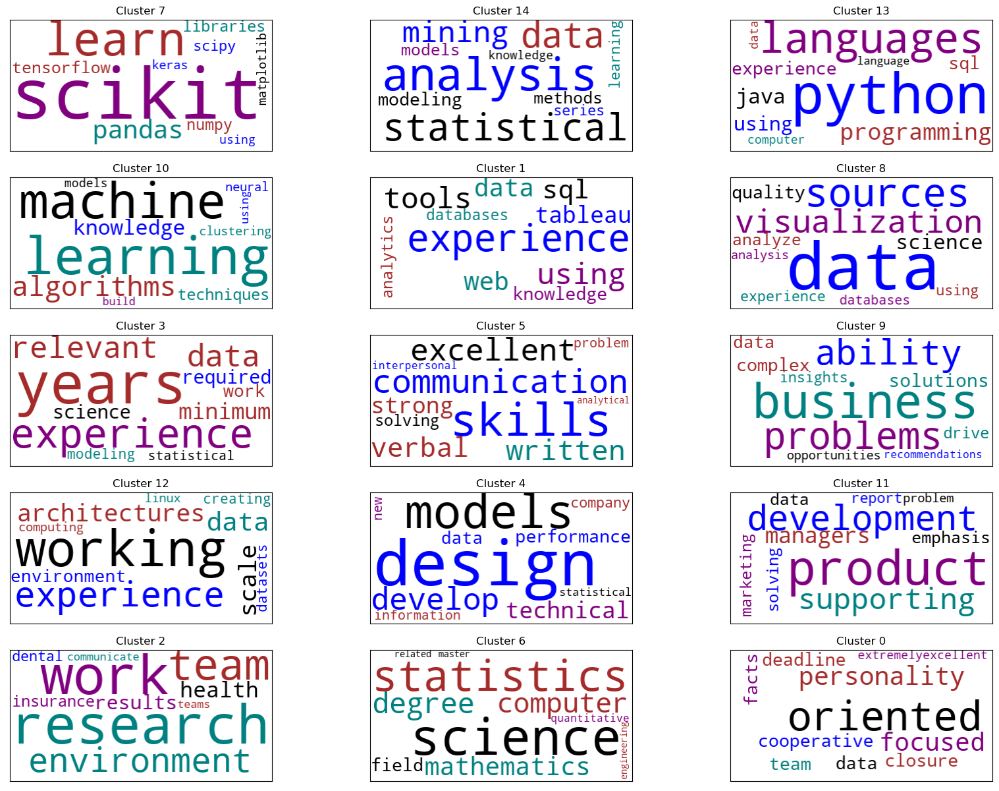

In [100]:
def sort_cluster_groups(cluster_groups):
    mean_similarities = [compute_mean_similarity(df_cluster)
                         for df_cluster in cluster_groups]
    
    sorted_indices = sorted(range(len(cluster_groups)),
                            key=lambda i: mean_similarities[i],
                            reverse=True)
    return [cluster_groups[i] for i in sorted_indices]

sorted_cluster_groups = sort_cluster_groups(cluster_groups)
plot_wordcloud_grid(sorted_cluster_groups)
plt.show()

Our hypothesis was right! The first 2 rows within the updated subplot clearly correspond to technical skills. F

### 17.4.2. Investigating the Technical Skill Clusters
Lets turn our attention to the 6 technical-skill cluster within first 2 rows of subplot grid. Below, we’ll re-plot their associated word-clouds in a 2-row by 3-column grid. 

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_featur

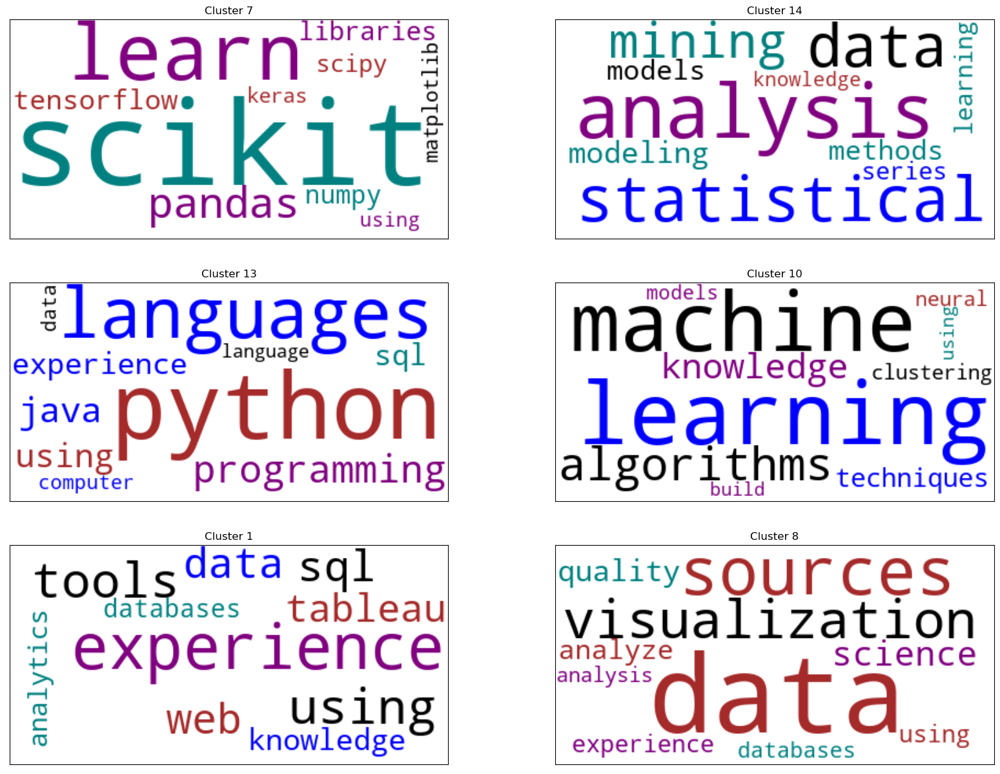

In [101]:
plot_wordcloud_grid(sorted_cluster_groups[:6], num_rows=3, num_columns=2)
plt.show()

The first 2 rows are insightful. We'll need to brush up on our machine learning skills. However, the final 2 technical-skill clusters appear are vague and uninformative. Below, we’ll sample bullets from these clusters (8 and 1) in order to confirm a lack of pattern.

**Listing 17. 41. Printing sample bullets from Clusters 8 and 1**

In [102]:
np.random.seed(1)
for cluster_id in [8, 1]:
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(cluster_id)


Cluster 8:
Use data to inform and label customer outcomes and processes
Perform exploratory data analysis for quality control and improved understanding
Champion a data-driven culture and help develop best-in-class data science capabilities
Work with data engineers to plan, implement, and automate integration of external data sources across a variety of architectures, including local databases, web APIs, CRM systems, etc
Design, implement, and maintain a cutting-edge cloud-based data-infrastructure for large data-sets

Cluster 1:
Have good knowledge on Project management tools JIRA, Redmine, and Bugzilla
Using common cloud computing platforms including AWS and GCP in addition to their respective utilities for managing and manipulating large data sources, model, development, and deployment
Experience in project deployment using Heroku/Jenkins and using web Services like Amazon Web Services (AWS)
Expert level data analytics experience with T-SQL and Tableau
Experience reviewing and asse

We’ve finished our analysis of the technical-skill clusters. 4 of these clusters were relevant. 2 were not. Now, lets turn our attention to the remaining soft-skill clusters.

### 17.4.3. Investing the Soft-Skill Clusters
We’ll start by visualizing the remaining 9 soft-skill clusters in a 3-row by 3-column grid.

**Listing 17. 42. Plotting the remaining 9 soft-skill clusters**

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_featur

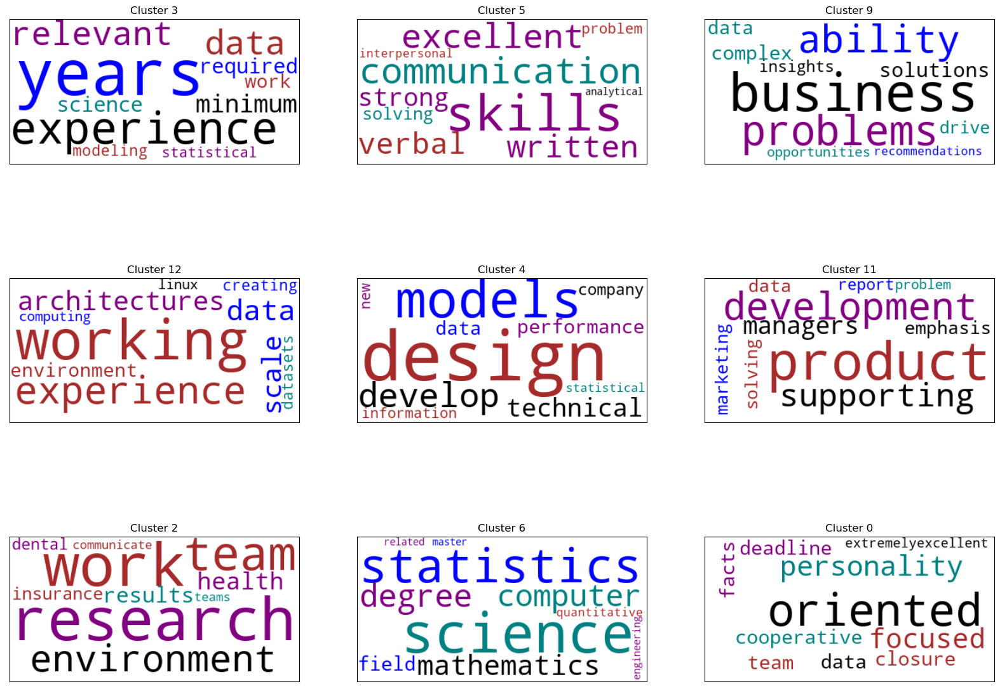

In [103]:
plot_wordcloud_grid(sorted_cluster_groups[6:], num_rows=3, num_columns=3)
plt.show()

The remaining clusters appear abmbiguous. Also, our soft-skill clusters do not represent true skills! For instance, Cluster 3 (row 0, column 0) consists of bullets requiring a minimal count of years working in industry. Similarly, Cluster 6 (row 2, column 1) represents educational constraints; requiring a quantitative degree to land an interview. 

**Listing 17. 43. Printing sample bullets from Clusters 6 and 3**

In [104]:
np.random.seed(1)
for cluster_id in [6, 3]:
    print(f'\nCluster {cluster_id}:')
    print_cluster_sample(cluster_id)


Cluster 6:
MS in a quantitative research discipline (e.g., Artificial Intelligence, Computer Science, Machine Learning, Statistics, Applied Math, Operations Research)
Master’s degree in data science, applied mathematics, or bioinformatics preferred.
PhD degree preferred
Ph.D. in a quantitative discipline (e.g., statistics, computer science, economics, mathematics, physics, electrical engineering, industrial engineering or other STEM fields)
7+ years of experience manipulating data sets and building statistical models, has advanced education in Statistics, Mathematics, Computer Science or another quantitative field, and is familiar with the following software/tools:

Cluster 3:
Minimum 6 years relevant work experience (if Bachelor’s degree) or minimum 3 years relevant work experience (if Master’s degree) with a proven track record in driving value in a commercial setting using data science skills.
Minimum five (5) years of experience manipulating data sets and building statistical mode

However, one of our soft-skill clusters is very easy to interpret. Cluster 5 (row 0, column 1) focuses on interpersonal communication skills; both written and verbal. 


### 17.4.4. Exploring Clusters at Alternative Values of K

Lets we’ll regenerate the clusters using alternative values of K. We’ll begin by setting K to 25, and plotting the results in a 5-row by 5-column grid. The subplots will be sorted based on cluster similarity to our resume. 

**Listing 17. 44. Visualizing 25 sorted clusters**

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_featur

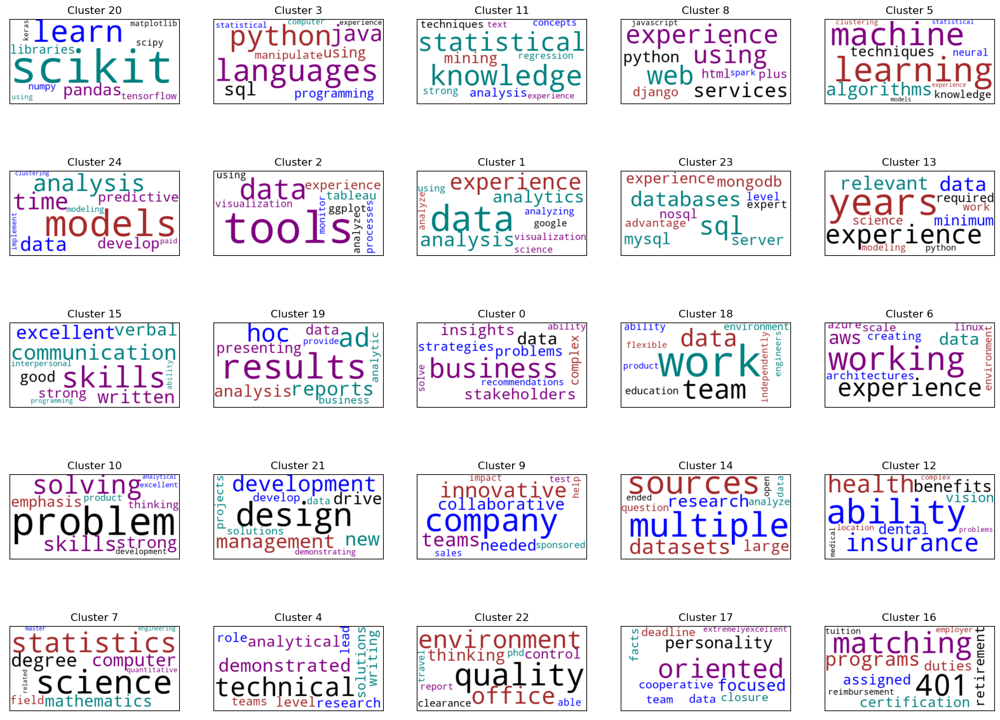

In [105]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=25)
sorted_cluster_groups = sort_cluster_groups(cluster_groups)
plot_wordcloud_grid(sorted_cluster_groups, num_rows=5, num_columns=5)
plt.show()

Raising K from 15 to 25 has retained all previously-observed insightful clusters. Also, the parameter change has introduced several new interesting clusters (Including Cluster 2: Non-Python Visualization tools and Cluster 23; Databases) Will the stability of these clusters persist if we shift K to an intermediate value of 20? Lets find out.

**Listing 17. 45. Visualizing 20 sorted clusters**

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_featur

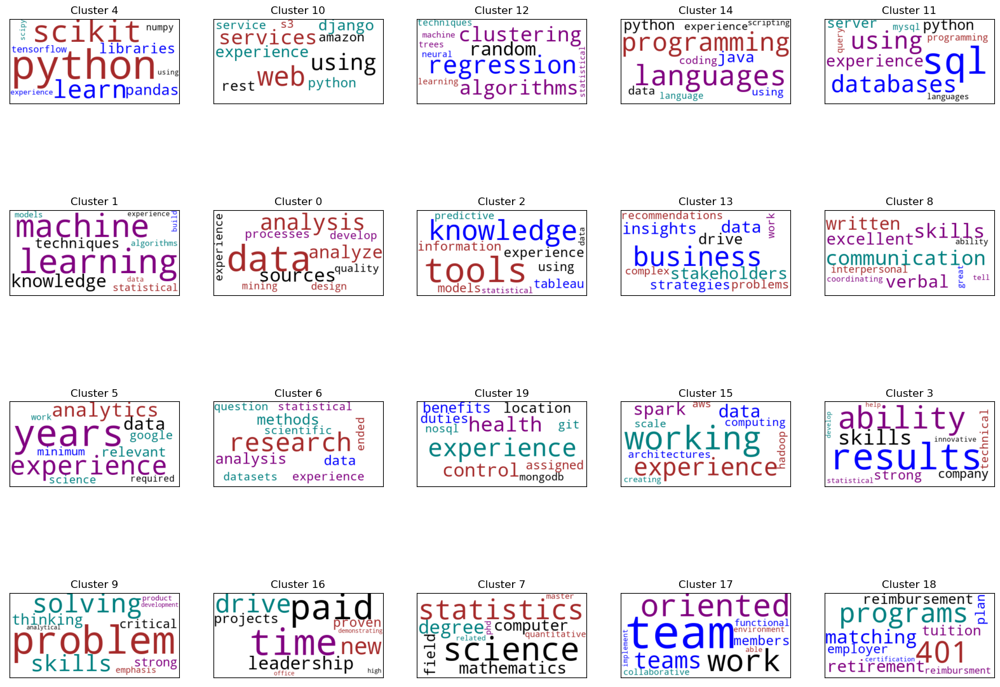

In [106]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=20)
sorted_cluster_groups = sort_cluster_groups(cluster_groups)
plot_wordcloud_grid(sorted_cluster_groups, num_rows=4, num_columns=5)
plt.show()

Most of our observed insightful clusters remain at `k=20`. However, the statistical analysis cluster observed at K-values of 15 and 25 is currently missing. If we cluster over just a single value of K, we risk missing out on useful insights. Thus, it’s preferable to visualize results over a range of K-values during text analysis. With this in mind, lets see what happens when we drop K to 10.

**Listing 17. 46. Visualizing 10 sorted clusters**

C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
C:\Users\22600\anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_featur

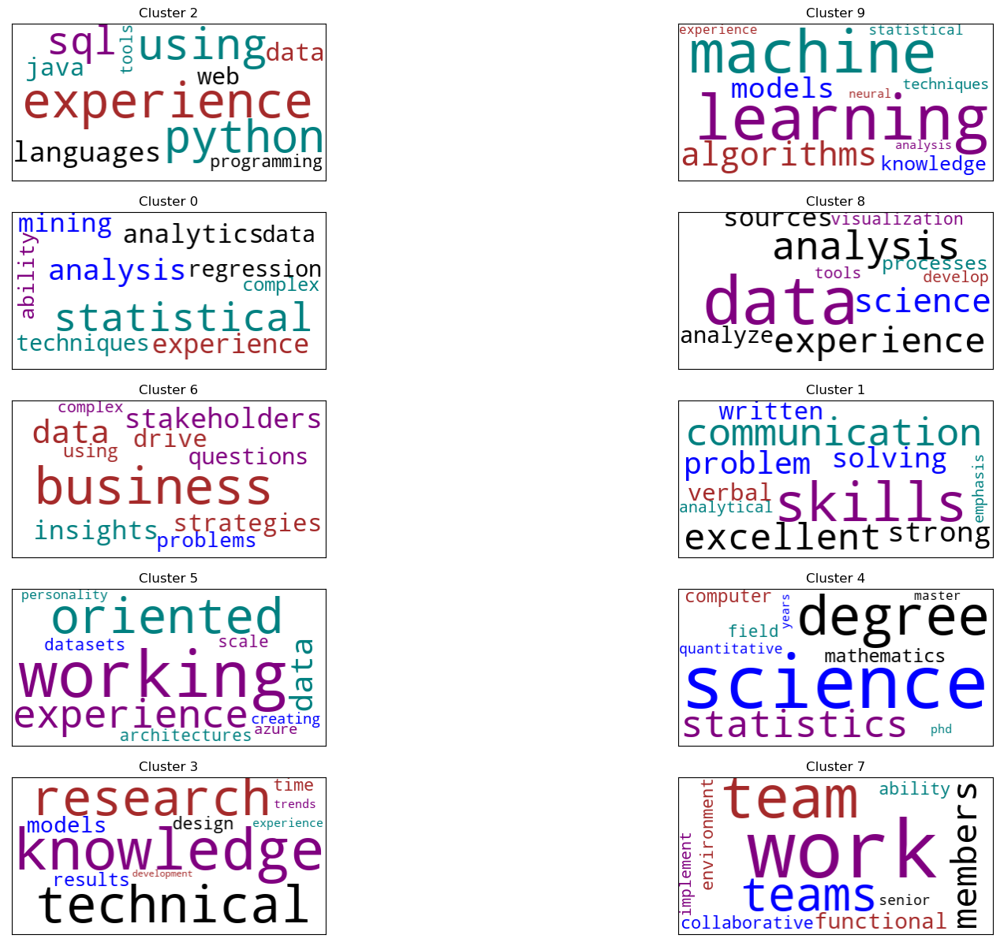

In [107]:
np.random.seed(0)
cluster_groups = compute_cluster_groups(shrunk_norm_matrix, k=10)
sorted_cluster_groups = sort_cluster_groups(cluster_groups)
plot_wordcloud_grid(sorted_cluster_groups, num_rows=5, num_columns=2)
plt.show()

The 10 visualized clusters are quite limited. Nonetheless, 4 of the 10 clusters contain the critical skills we’ve previously observed. These include Python programming (row 0, column 0), machine learning (row 0, column 1), and communication skills (row 2, column 1). Also, the statistical analysis cluster has reappered (row 1, column 0).
Surprisingly, some of our skill-clusters are quite versatile. 

So far, our observations have been limited to the 60 most relevant job postings. What will happen if we extand our analysis to the top 700 postings?  We’ll now find out.

### 17.4.5. Analyzing the 700 Most-Relevant Postings

We’ll start by preparing `sorted_df_jobs[:700].Bullets` for clustering.

**Listing 17. 47. `Preparing sorted_df_jobs[:700]` for clustering analysis**

In [108]:
np.random.seed(0)
total_bullets_700 = set()
for bullets in sorted_df_jobs[:700].Bullets:
    total_bullets_700.update([bullet.strip()
                              for bullet in bullets])

total_bullets_700 = sorted(total_bullets_700)
vectorizer_700 = TfidfVectorizer(stop_words='english')
tfidf_matrix_700 = vectorizer_700.fit_transform(total_bullets_700)
shrunk_norm_matrix_700 = shrink_matrix(tfidf_matrix_700)
print(f"We've vectorized {shrunk_norm_matrix_700.shape[0]} bullets")

We've vectorized 10194 bullets


We’ve vectorized 10,194 bullet-points. Now, we’ll generate an Elbow plot across the vectorized results. Based on previous observations, we don’t expect the Elbow plot to be particularly informative. 

**Listing 17. 48. Plotting an elbow curve for 10,194 bullets**

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\22600\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\2

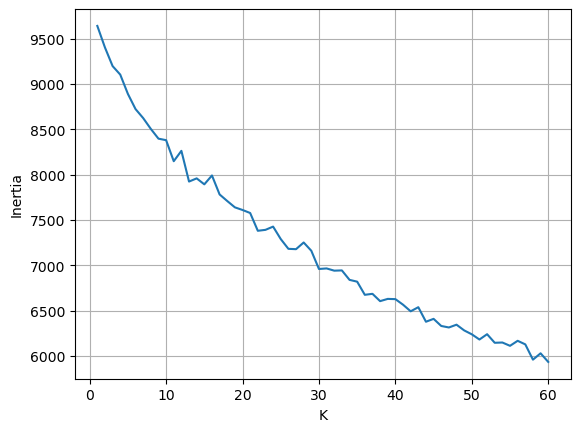

In [109]:
np.random.seed(0)
generate_elbow_plot(shrunk_norm_matrix_700)

As expected, the precise location of the elbow is not clear within the plot. The elbow is spread out between a K of 10 and 25. We’ll deal with ambiguity, by arbitrarily setting K to 20.

**WARNING: As we discussed in Section Fifteen, the K-means outputs could vary across computers for large matrices containing 10,000-by-100 elements. Thus, your local clustering results might differ from the output seen below. Nonetheless, you should be able to draw similar conclusions to the ones presented in this book.**

**Listing 17. 49. Visualizing 20 sorted clusters for 10,194 bullets**

In [110]:
np.random.seed(0)
cluster_groups_700 = compute_cluster_groups(shrunk_norm_matrix_700, k=20)
bullet_cosine_similarities = compute_bullet_similarity(total_bullets_700)
sorted_cluster_groups_700 = sort_cluster_groups(cluster_groups_700)
plot_wordcloud_grid(sorted_cluster_groups_700, num_rows=4, num_columns=5,
                    vectorizer=vectorizer_700, tfidf_matrix=tfidf_matrix_700)

ValueError: All arrays must be of the same length

Our clustering output looks very similar to what we’ve seen before. The key insightful clusters we’ve observed at 60 postings still remain.